In [1]:
import sys
sys.path.append("..")
from MPRA_predict.utils import *
from MPRA_predict.datasets import *
from MPRA_predict.metrics import *

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', 1000)
pd.set_option('display.precision', 3)
np.set_printoptions(linewidth=1000)

In [2]:
cell_types = ['K562', 'HepG2', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']

In [3]:
MPRA_df = pd.read_csv('../data/SirajMPRA/SirajMPRA_562654_0317.csv')
MPRA_df

,description,seq,A549,HepG2,K562,SK-N-SH,HCT116,is_ref,chr,pos,ref,alt,start,end,585605_index,HepG2_DNase,HepG2_H3K4me3,HepG2_H3K27ac,HepG2_CTCF,K562_DNase,K562_H3K4me3,K562_H3K27ac,K562_CTCF,SK-N-SH_DNase,SK-N-SH_H3K4me3,SK-N-SH_H3K27ac,SK-N-SH_CTCF,A549_DNase,A549_H3K4me3,A549_H3K27ac,A549_CTCF,HCT116_DNase,HCT116_H3K4me3,HCT116_H3K27ac,HCT116_CTCF
0,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,0.256,-1.092,0.156,-0.223,True,chr1,14677,G,A,14577,14777,0,1.313,1.923,1.661,1.207,1.434,2.131,1.846,1.459,1.430,2.004,1.373,1.165,1.121,2.139,1.727,1.287,0.923,2.057,1.624,1.192
1,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,-0.003,0.068,0.066,-0.719,False,chr1,14677,G,A,14577,14777,1,1.294,1.913,1.664,1.235,1.412,2.114,1.854,1.478,1.373,1.932,1.342,1.172,1.108,2.092,1.698,1.309,0.913,2.023,1.597,1.216
2,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,0.877,-0.803,0.354,0.821,True,chr1,63697,T,C,63597,63797,2,1.026,1.174,0.922,0.409,0.319,0.462,0.157,0.077,-0.110,1.248,1.787,0.427,1.392,1.204,0.838,0.314,0.907,0.570,0.795,0.221
3,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,0.756,-1.050,-0.154,0.766,False,chr1,63697,T,C,63597,63797,3,1.022,0.990,0.783,0.411,0.224,0.305,0.004,0.031,-0.260,0.935,1.525,0.331,1.384,0.969,0.632,0.298,0.922,0.446,0.676,0.203
4,chr1:64764:C:T,AATAGACTCTAGTACTCTGTATTATGCAAAATTTGTCTATGTTACA...,NaN,-0.649,-0.449,0.119,-0.114,True,chr1,64764,C,T,64664,64864,4,-0.988,-0.719,-0.858,-0.901,-0.765,-0.781,-0.662,-0.702,-0.835,-0.535,-0.424,-0.759,-1.083,-0.813,-0.803,-0.821,-0.932,-0.819,-0.736,-0.672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562649,chrX:155233098:T:C,ATCATTTACTGGTGACTGCCCTGCTAGGGTGTCAGCTGTCAGATCC...,NaN,0.203,1.334,0.397,0.749,False,chrX,155233098,T,C,155232998,155233198,585600,2.066,2.190,2.592,1.500,1.432,1.429,1.501,1.072,1.033,0.962,0.688,1.042,1.518,2.014,2.117,1.190,1.163,1.556,1.322,0.957
562650,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,1.021,0.070,2.294,1.259,True,chrX,155233794,A,G,155233694,155233894,585601,0.844,1.232,0.820,0.878,0.668,0.696,0.611,0.360,1.408,1.956,2.360,1.108,1.744,1.473,1.525,0.911,1.850,1.703,1.653,0.852
562651,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,0.490,-0.510,1.487,0.482,False,chrX,155233794,A,G,155233694,155233894,585602,0.810,1.391,0.957,0.843,0.601,0.870,0.746,0.399,1.332,1.832,1.878,1.018,1.374,1.496,1.356,0.833,1.467,1.782,1.487,0.710
562652,chrX:155234730:T:C,TGGTGAGTTGCTTCTGTGCACACACTTTTGTTTATGAGTGTGCATG...,NaN,-0.110,-0.290,-0.382,0.093,True,chrX,155234730,T,C,155234630,155234830,585603,0.332,0.238,0.301,0.369,0.197,0.448,0.404,0.015,0.536,-0.096,-0.573,0.347,0.942,0.194,-0.096,0.126,0.348,-0.175,-0.273,-0.135


In [4]:
pearson_df = pd.DataFrame(index=cell_types, columns=assays, dtype=float)
np.full(shape=(len(cell_types), len(assays)), fill_value=np.nan)

for i, cell_type in enumerate(cell_types):
    for j, assay in enumerate(assays):
        enhancer_activity = MPRA_df[cell_type]
        predicted_feature = MPRA_df[f'{cell_type}_{assay}']
        r, _ = pearson(predicted_feature, enhancer_activity)
        pearson_df.loc[cell_type, assay] = r
            
pearson_df

,DNase,H3K4me3,H3K27ac,CTCF
HepG2,0.443,0.469,0.427,0.350
K562,0.499,0.451,0.444,0.364
SK-N-SH,0.368,0.486,0.470,0.298
A549,0.348,0.362,0.363,0.247
HCT116,0.424,0.443,0.452,0.329


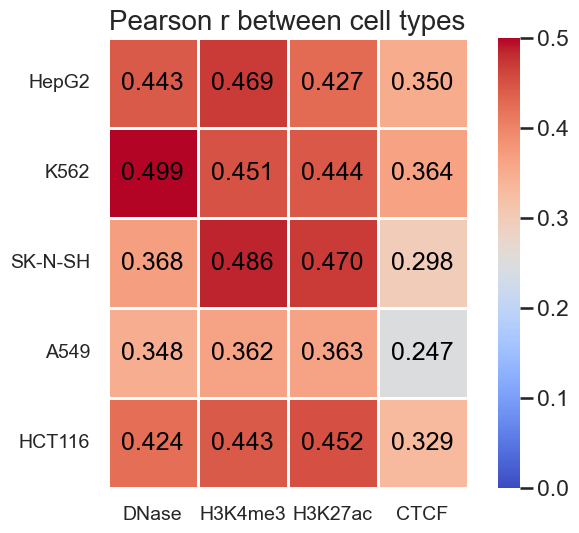

In [10]:
plt.figure(figsize=(8, 6), dpi=100)
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.9, top=0.9)
sns.heatmap(
    pearson_df, square=True, linewidths=1, cmap='coolwarm', vmin=0, vmax=0.5, 
    annot=True, fmt='.3f', annot_kws={'fontsize': 18, 'color': 'black'})
plt.xticks(
    ticks=np.arange(len(assays))+0.5, labels=assays, 
    rotation=0, fontsize=14)
plt.yticks(
    ticks=np.arange(len(cell_types))+0.5, labels=cell_types, 
    rotation=0, fontsize=14)
plt.title(f'Pearson r between cell types', fontsize=20)
plt.savefig(f'figures/heatmap_pearson_r_epi_feature_vs_enhancer_activity.png', dpi=400)
plt.show()

In [24]:
x_pos = np.arange(5).reshape(1,-1).repeat(4, axis=0)
x_pos = x_pos + np.arange(0, 20, 6).reshape(-1,1)
x_pos

array([[ 0,  1,  2,  3,  4],
       [ 6,  7,  8,  9, 10],
       [12, 13, 14, 15, 16],
       [18, 19, 20, 21, 22]])

/tmp/ipykernel_92412/3090127599.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


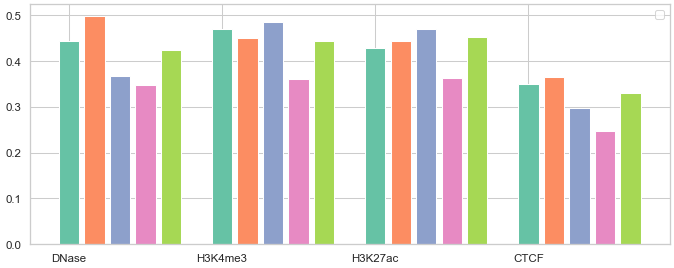

In [28]:
plt.figure(figsize=(16, 6), dpi=50)
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)

for j, assay in enumerate(assays):
    for i, cell_type in enumerate(cell_types):
        y = pearson_df.loc[cell_type, assay]
        plt.bar(x=x_pos[j, i], height=y, color=color_list[i])

plt.xticks(x_pos[:, 0], assays)
plt.legend()
plt.savefig(f'figures/bar_pearson.png')
plt.show()

/tmp/ipykernel_92412/4053650076.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


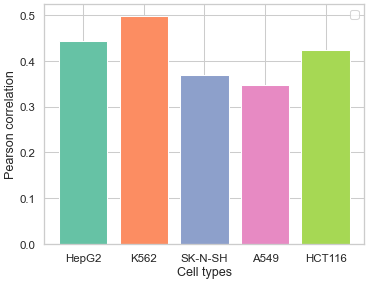

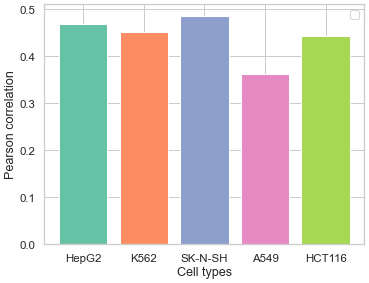

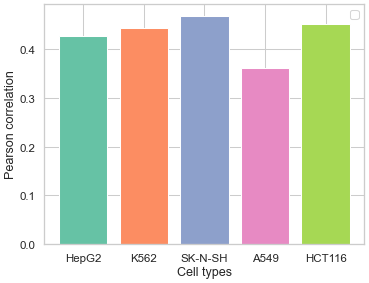

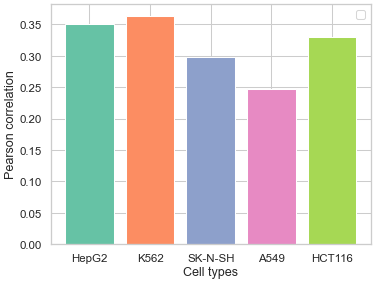

In [29]:
for j, assay in enumerate(assays):
    plt.figure(figsize=(8, 6), dpi=50)
    plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
    x = pearson_df.index
    y = pearson_df[assay]
    plt.bar(x, y, color=color_list[:5])
    plt.xlabel('Cell types')
    plt.ylabel('Pearson correlation')
    plt.legend()
    plt.savefig(f'figures/bar_pearson_{assay}.png')
    plt.show()

In [5]:
data_split_dict = {}
data_split_dict['total'] = np.ones(len(MPRA_df), dtype=bool)
data_split_dict['chrom'] = MPRA_df['chr'].isin([f'chr{i}' for i in range(1, 23)])
data_split_dict['train'] = MPRA_df['chr'].isin([f'chr{i}' for i in range(3, 23)])
data_split_dict['valid'] = MPRA_df['chr'].isin(['chr1'])
data_split_dict['test'] = MPRA_df['chr'].isin(['chr2'])
data_split_dict['designed'] = MPRA_df['chr'].isin(['chr0'])


stds = MPRA_df[cell_types].std(axis=1, skipna=True)
threshold = np.percentile(stds.dropna(), 90)
data_split_dict['diff'] = (stds > threshold)
data_split_dict['const'] = ~data_split_dict['diff']

# MPRA_df['diff'] = (MPRA_df[cell_types].max(axis=1) - MPRA_df[cell_types].min(axis=1)) > 1
# data_split_dict['const'] = ~MPRA_df['diff']
# data_split_dict['diff']  = MPRA_df['diff']
print(len(MPRA_df), data_split_dict['const'].sum(), data_split_dict['diff'].sum())


keys = list(data_split_dict.keys())
for k1 in keys:
    for k2 in keys:
        data_split_dict[f'{k1}_{k2}'] = data_split_dict[k1] & data_split_dict[k2]

562654 506509 56145


In [7]:
cell_types = ['K562', 'HepG2', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']

for assay in assays:
    for data_split in ['total', 'const', 'diff',]:
        cell_types_assay = [f'{cell_type}_{assay}' for cell_type in cell_types]
        r_array = pd.DataFrame(index=cell_types, columns=cell_types_assay)
        for cell_type in cell_types:
            for cell_type_assay in cell_types_assay:
                condition = data_split_dict[data_split]
                df = MPRA_df[condition]
                x, y = np.array(df[f'{cell_type}']), np.array(df[f'{cell_type_assay}'])
                r, p = pearson(x, y)
                r_array.loc[cell_type, cell_type_assay] = r
        print(data_split)
        print(r_array)
        print()

total
        HepG2_DNase K562_DNase SK-N-SH_DNase A549_DNase HCT116_DNase
HepG2         0.443      0.483         0.398      0.435        0.444
K562          0.353      0.499         0.357      0.382        0.404
SK-N-SH       0.336      0.425         0.368      0.370        0.378
A549          0.297      0.364         0.273      0.348        0.367
HCT116        0.368      0.427         0.364      0.389        0.424

const
        HepG2_DNase K562_DNase SK-N-SH_DNase A549_DNase HCT116_DNase
HepG2         0.365      0.424         0.345      0.353        0.368
K562          0.308      0.430         0.312      0.331        0.351
SK-N-SH       0.296      0.385         0.331      0.312        0.319
A549          0.223      0.298         0.220      0.255        0.273
HCT116        0.306      0.370         0.314      0.317        0.345

diff
        HepG2_DNase K562_DNase SK-N-SH_DNase A549_DNase HCT116_DNase
HepG2         0.521      0.477         0.428      0.498        0.475
K562          0

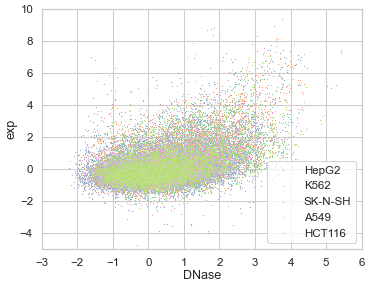

In [6]:
plt.figure(figsize=(8, 6), dpi=50)
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
handles = []
for i, cell_type in enumerate(cell_types):
    x = MPRA_df_stack[f'{cell_type}_DNase'][:10000]
    y = MPRA_df_stack[f'{cell_type}'][:10000]
    sns.scatterplot(x=x, y=y, s=3, color=color_list[i], label=cell_type)
    handles.append(mpatches.Patch(color=color_list[i], label=cell_type))
plt.xlim(-3, 6)
plt.ylim(-5, 10)
plt.xlabel('DNase')
plt.ylabel('exp')
plt.legend(loc="lower right")
plt.savefig('figures/DNase_exp', dpi=400)
plt.show()

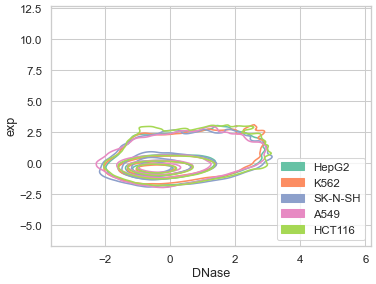

In [5]:
plt.figure(figsize=(8, 6), dpi=50)
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
handles = []
for i, cell_type in enumerate(cell_types):
    x = MPRA_df_stack[f'{cell_type}_DNase'][:100000]
    y = MPRA_df_stack[f'{cell_type}'][:100000]
    sns.kdeplot(x=x, y=y, color=color_list[i], label=cell_type, levels=5)
    handles.append(mpatches.Patch(color=color_list[i], label=cell_type))
plt.xlabel('DNase')
plt.ylabel('exp')
plt.legend(handles=handles, loc="lower right") 
plt.savefig('figures/kde_dnase_exp.png', dpi=400)
plt.show()

In [ ]:
cell_types = ['K562', 'HepG2', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']

for assay in assays:
    for i, cell_type in enumerate(cell_types):
        df = MPRA_df_stack
        x = np.array(df[f'{cell_type}_{assay}'])
        y = np.array(df[f'{cell_type}'])
        r, _ = pearson(x, y)
        r2, _ = spearman(x, y)
        print('r', r)

        fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8, 6), dpi=100)
        plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
        sns.scatterplot(x=x, y=y, s=1, color=color_list[i], alpha=0.2)
        sns.kdeplot(x=x[:10000], y=y[:10000], levels=5, color=color_list[i])
        plt.xlim(-4, 6)
        plt.ylim(-4, 8)
        plt.text(x=0.1, y=0.8, s=f'Pearson correlation = {r:.3f} \nSpearman correlation = {r2:.3f} \nn = {len(x)}', 
                 fontsize=16, transform=plt.gca().transAxes)
        plt.xlabel(f'{cell_type} {assay}')
        plt.ylabel(f'{cell_type} enhancer activity')
        plt.title(f'{cell_type} {assay} vs {cell_type} enhancer activity')
        plt.savefig(f'figures/kde_{cell_type}_{assay}_enhancer_activity.png', dpi=400)
        plt.show()

In [8]:
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from scipy.stats import pearsonr as pearson, spearmanr as spearman

# cell_types = ['K562', 'HepG2', 'SK-N-SH', 'A549', 'HCT116']
# assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']
# color_list = ['b', 'g', 'r', 'c', 'm']  # 给不同cell type指定颜色

# for assay in assays[:1]:
#     df = MPRA_df_stack  # 这里假设 df 事先已定义

#     fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8, 6), dpi=100)
#     plt.subplots_adjust(left=0.08, bottom=0.1, right=0.95, top=0.9, wspace=0.3, hspace=0.3)

#     for i, cell_type in enumerate(cell_types):
#         ax = axes[i // 3, i % 3]  # 2x3 子图中的位置

#         x = np.array(df[f'{cell_type}_{assay}'])
#         y = np.array(df[f'{cell_type}'])
#         r, _ = pearson(x, y)
#         r2, _ = spearman(x, y)

#         sns.scatterplot(x=x, y=y, s=1, color=color_list[i], alpha=0.2, ax=ax)
#         # sns.kdeplot(x=x[:10000], y=y[:10000], levels=5, color=color_list[i], ax=ax)
#         ax.set_xlim(-4, 6)
#         ax.set_ylim(-4, 8)
#         ax.text(0.05, 0.85, f'Pearson = {r:.3f}\nSpearman = {r2:.3f}\nn = {len(x)}',
#                 fontsize=10, transform=ax.transAxes)

#         ax.set_xlabel(f'{cell_type} {assay}')
#         ax.set_ylabel(f'{cell_type} enhancer activity')
#         ax.set_title(f'{cell_type} {assay} vs enhancer activity')

#     # 移除右下角空白子图
#     fig.delaxes(axes[1, 2])

#     # 保存图像
#     plt.savefig(f'figures/kde_{assay}_enhancer_activity.png', dpi=400)
#     plt.show()


r 0.4425492606032638


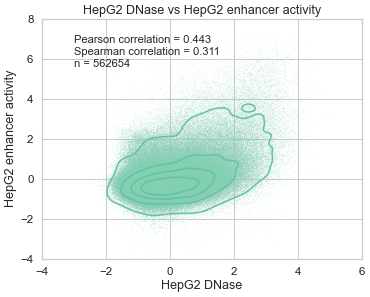

r 0.49865127884222205


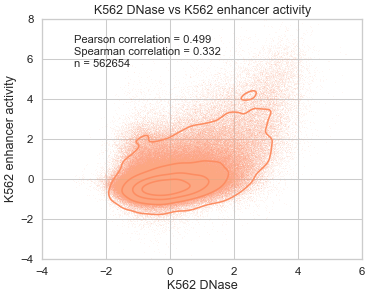

r 0.36796093128032215


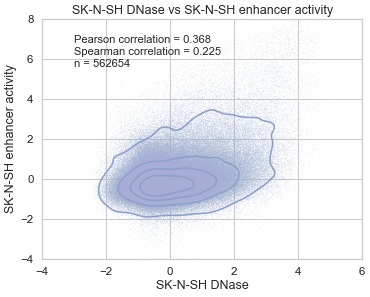

r 0.34801156003995587


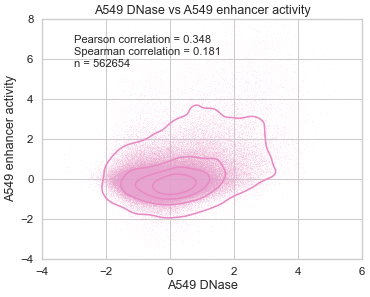

r 0.4257908736340514


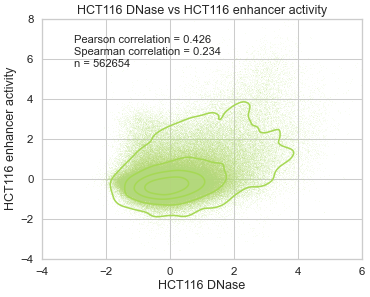

r 0.46876764372767066


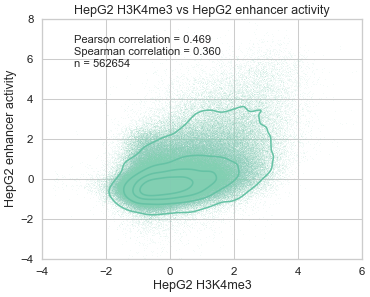

r 0.45095817296334456


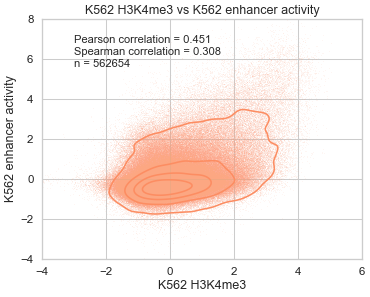

r 0.46198413241104547


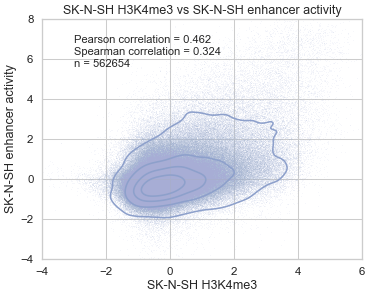

r 0.36150357613303347


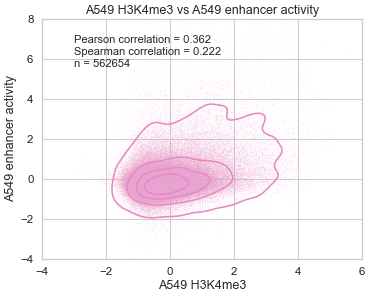

r 0.44558833614069515


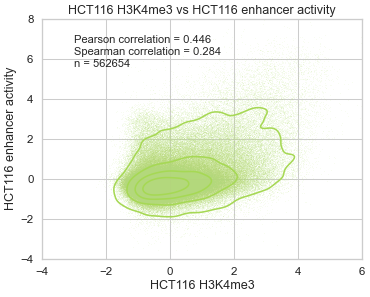

r 0.42731661732584275


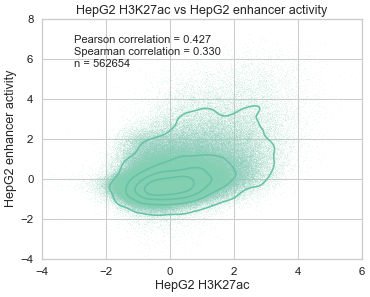

r 0.44374257405424117


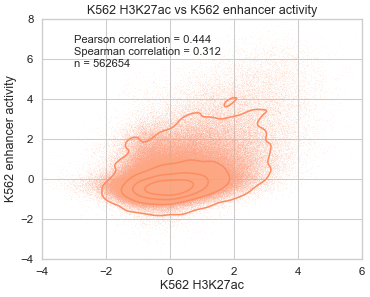

r 0.4695679202820623


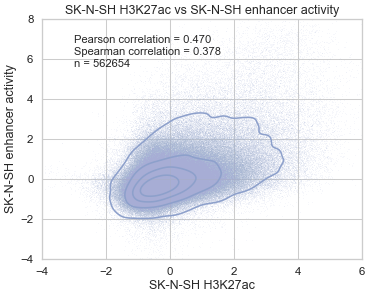

r 0.3625770512916959


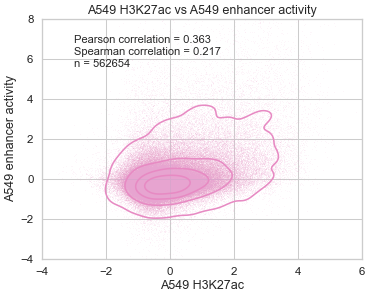

r 0.4516531662740146


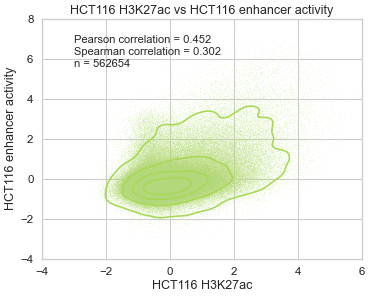

r 0.3502348024953547


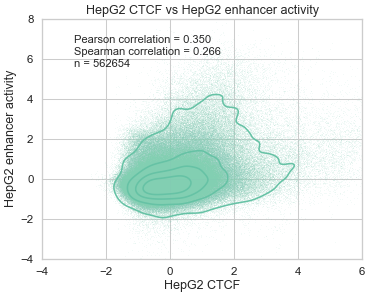

r 0.36307116152154684


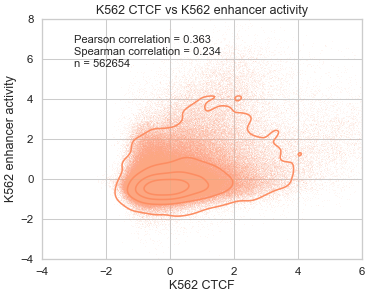

r 0.3157506802407167


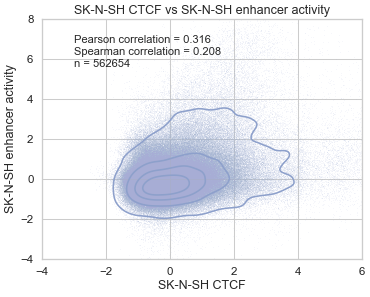

r 0.247384925984072


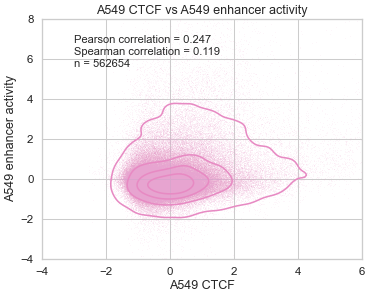

r 0.33215694046864097


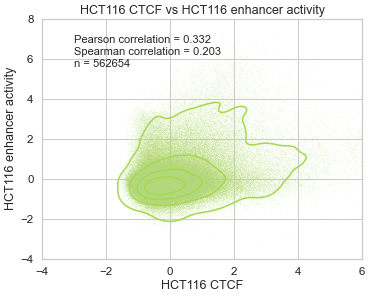

In [15]:
cell_types = ['K562', 'HepG2', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']

for assay in assays:
    for i, cell_type in enumerate(cell_types):
        df = MPRA_df_stack
        x = np.array(df[f'{cell_type}_{assay}'])
        y = np.array(df[f'{cell_type}'])
        r, _ = pearson(x, y)
        r2, _ = spearman(x, y)
        print('r', r)

        plt.figure(figsize=(8, 6), dpi=50)
        plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
        sns.scatterplot(x=x, y=y, s=1, color=color_list[i], alpha=0.2)
        sns.kdeplot(x=x[:10000], y=y[:10000], levels=5, color=color_list[i])
        plt.xlim(-4, 6)
        plt.ylim(-4, 8)
        plt.text(x=0.1, y=0.8, s=f'Pearson correlation = {r:.3f} \nSpearman correlation = {r2:.3f} \nn = {len(x)}', 
                 fontsize=16, transform=plt.gca().transAxes)
        plt.xlabel(f'{cell_type} {assay}')
        plt.ylabel(f'{cell_type} enhancer activity')
        plt.title(f'{cell_type} {assay} vs {cell_type} enhancer activity')
        plt.savefig(f'figures/kde_{cell_type}_{assay}_enhancer_activity.png', dpi=400)
        plt.show()

In [15]:
# import fastkde
# from fastkde import fastKDE

# assay = 'DNase'

# df = MPRA_df_stack
# x = np.array(df[f'HepG2_{assay}'])
# y = np.array(df[f'HepG2'])
# r, p = pearson(x, y)
# print(r)

# plt.figure(figsize=(8, 6), dpi=50)
# plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
# sns.scatterplot(x=x, y=y, s=1, color=color_list[0], alpha=0.2)
# # sns.kdeplot(x=x, y=y, levels=5, color=color_list[0])


# from scipy.stats import gaussian_kde
# x, y = remove_nan(x, y)
# data = np.stack([x, y], axis=0)
# kde = gaussian_kde(data)
# # x_vals = np.linspace(np.min(x), np.max(x), 1000)
# # y_vals = kde(x_vals)
# # plt.plot(x_vals, y_vals, label="scipy KDE")

# # pdf = fastkde.pdf(x, y, var_names = ['x', 'y'])
# # pdf.plot()

# # x, y = remove_nan(x, y)

# # data = np.concatenate([x.reshape(-1, 1), y.reshape(-1, 1)], axis=1)
# # pdf, axes = fastKDE(data)
# # plt.plot(axes[0], pdf, label="fastKDE")
# # plt.legend()
# # plt.show()

# # Create a meshgrid to evaluate the KDE
# x_vals = np.linspace(np.min(x), np.max(x), 100)
# y_vals = np.linspace(np.min(y), np.max(y), 100)
# X, Y = np.meshgrid(x_vals, y_vals)
# positions = np.vstack([X.ravel(), Y.ravel()])

# # Evaluate KDE
# Z = kde(positions).reshape(X.shape)

# # Plot the density
# plt.contourf(X, Y, Z, levels=20, cmap="Blues")
# plt.colorbar(label="Density")
# plt.xlabel("x")
# plt.ylabel("y")
# plt.title("Bivariate KDE")
# plt.show()


0.4425492606032638


0.516063124154215


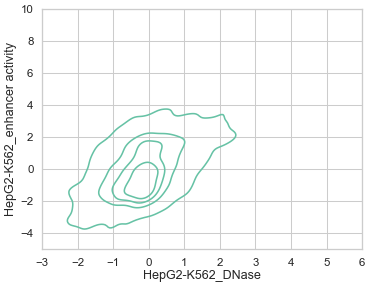

0.5369812973751125


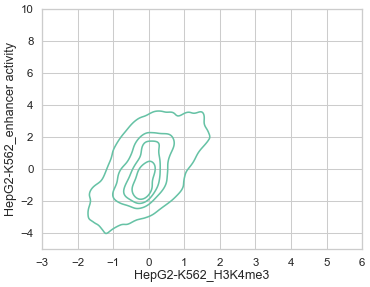

0.4815879865715812


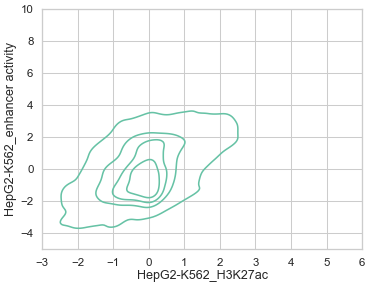

0.4679067021456993


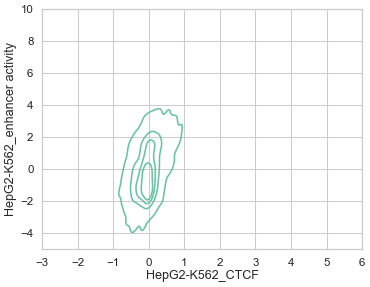

In [23]:
for assay in assays:
    for data_split in ['diff']:
        df = MPRA_df_stack[data_split_dict[data_split]]
        x = np.array(df[f'HepG2_{assay}']) - np.array(df[f'K562_{assay}'])
        y = np.array(df[f'HepG2']) - np.array(df[f'K562'])
        r, p = pearson(x, y)
        print(r)

        plt.figure(figsize=(8, 6), dpi=50)
        plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
        # sns.scatterplot(x=x, y=y, s=3, color=color_list[0])
        sns.kdeplot(x=x[:10000], y=y[:10000], levels=5, color=color_list[0])
        plt.xlim(-4, 4)
        plt.ylim(-4, 4)
        plt.xlabel(f'HepG2-K562_{assay}')
        plt.ylabel(f'HepG2-K562_enhancer activity')
        # plt.savefig(f'figures/scatter_HepG2-K562_{assay}_exp.png', dpi=400)
        plt.savefig(f'figures/kde_HepG2-K562_{assay}_exp.png', dpi=400)
        plt.show()

0.516063124154215


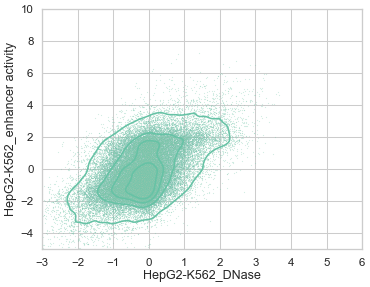

In [27]:
for assay in ['DNase']:
    for data_split in ['diff']:
        df = MPRA_df_stack[data_split_dict[data_split]]
        x = np.array(df[f'HepG2_{assay}']) - np.array(df[f'K562_{assay}'])
        y = np.array(df[f'HepG2']) - np.array(df[f'K562'])
        r, p = pearson(x, y)
        print(r)

        plt.figure(figsize=(8, 6), dpi=50)
        plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
        sns.scatterplot(x=x, y=y, s=1, color=color_list[0], alpha=0.2)
        sns.kdeplot(x=x, y=y, levels=5, color=color_list[0])
        plt.xlim(-3, 6)
        plt.ylim(-5, 10)
        plt.xlabel(f'HepG2-K562_{assay}')
        plt.ylabel(f'HepG2-K562_enhancer activity')
        # plt.savefig(f'figures/scatter_HepG2-K562_{assay}_exp.png', dpi=400)
        plt.savefig(f'figures/kde_HepG2-K562_{assay}_exp.png', dpi=400)
        plt.show()




        

In [11]:
# overall corr

cell_types = ['K562', 'HepG2', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']

df_list = []
for i, cell_type in enumerate(cell_types):
    df = MPRA_df[['description', 'seq', 'chr', 'is_ref', 'pos', 'ref', 'alt', 'start', 'end']].copy()
    df['cell_type'] = cell_type
    df['exp'] = MPRA_df[cell_type]
    for j, assay in enumerate(assays):
        df[assay] = MPRA_df[f'{cell_type}_{assay}']
        df_list.append(df)

MPRA_df_concat = pd.concat(df_list, axis=0)
MPRA_df_concat

,description,seq,chr,is_ref,pos,ref,alt,start,end,cell_type,exp,DNase,H3K4me3,H3K27ac,CTCF
0,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,chr1,True,14677,G,A,14577,14777,HepG2,0.256,1.313,1.923,1.661,1.207
1,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,chr1,False,14677,G,A,14577,14777,HepG2,-0.003,1.294,1.913,1.664,1.235
2,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,chr1,True,63697,T,C,63597,63797,HepG2,0.877,1.026,1.174,0.922,0.409
3,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,chr1,False,63697,T,C,63597,63797,HepG2,0.756,1.022,0.990,0.783,0.411
4,chr1:64764:C:T,AATAGACTCTAGTACTCTGTATTATGCAAAATTTGTCTATGTTACA...,chr1,True,64764,C,T,64664,64864,HepG2,-0.649,-0.988,-0.719,-0.858,-0.901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562649,chrX:155233098:T:C,ATCATTTACTGGTGACTGCCCTGCTAGGGTGTCAGCTGTCAGATCC...,chrX,False,155233098,T,C,155232998,155233198,HCT116,0.749,1.163,1.556,1.322,0.957
562650,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,chrX,True,155233794,A,G,155233694,155233894,HCT116,1.259,1.850,1.703,1.653,0.852
562651,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,chrX,False,155233794,A,G,155233694,155233894,HCT116,0.482,1.467,1.782,1.487,0.710
562652,chrX:155234730:T:C,TGGTGAGTTGCTTCTGTGCACACACTTTTGTTTATGAGTGTGCATG...,chrX,True,155234730,T,C,155234630,155234830,HCT116,0.093,0.348,-0.175,-0.273,-0.135


In [12]:
for j, assay in enumerate(assays):
    x = np.array(MPRA_df_concat['exp'])
    y = np.array(MPRA_df_concat[assay])
    r, p = pearson(x, y)
    print(f'{assay}: {r}')

DNase: 0.4255016005785427
H3K4me3: 0.4536468508217336
H3K27ac: 0.43911840755626574
CTCF: 0.3271933026206829


overall corr DNase: 0.4255016005785427


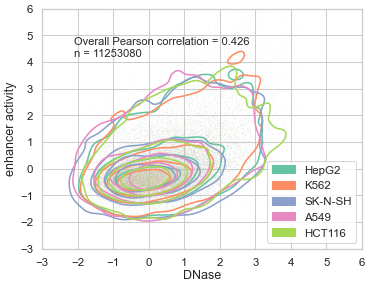

overall corr H3K4me3: 0.4536468508217336


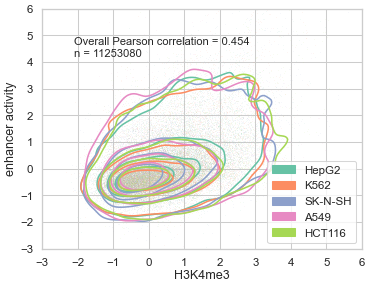

overall corr H3K27ac: 0.43911840755626574


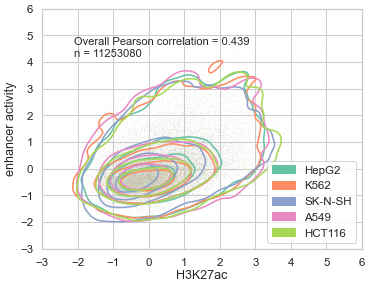

overall corr CTCF: 0.3271933026206829


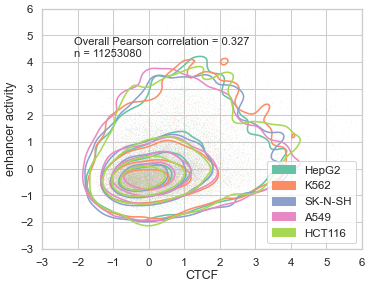

In [13]:
for j, assay in enumerate(assays):
    x = np.array(MPRA_df_concat['exp'])
    y = np.array(MPRA_df_concat[assay])
    r, p = pearson(x, y)
    print(f'overall corr {assay}: {r}')

    plt.figure(figsize=(8, 6), dpi=50)
    plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
    handles = []
    for i, cell_type in enumerate(cell_types):
        x = MPRA_df[f'{cell_type}_{assay}'][:10000]
        y = MPRA_df[f'{cell_type}'][:10000]
        sns.scatterplot(x=x, y=y, s=1, color=color_list[i], alpha=0.2)
        sns.kdeplot(x=x, y=y, levels=5, color=color_list[i])
        handles.append(mpatches.Patch(color=color_list[i], label=cell_type))
    plt.xlim(-3, 6)
    plt.ylim(-3, 6)
    plt.xlabel(f'{assay}')
    plt.ylabel(f'enhancer activity')
    plt.text(
        x=0.1, y=0.8, s=f'Overall Pearson correlation = {r:.3f} \nn = {len(MPRA_df_concat)}', 
        fontsize=16, transform=plt.gca().transAxes)
    plt.legend(handles=handles, loc="lower right") 
    plt.savefig(f'figures/kde_scatter_overall_{assay}_enhancer_activity.png', dpi=400)
    plt.show()

In [ ]:
# plt.figure(figsize=(8, 6), dpi=50)
# plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
# handles = []
# for i, cell_type in enumerate(cell_types):
#     x = MPRA_df[f'{cell_type}_DNase'][:100000]
#     y = MPRA_df[f'{cell_type}'][:100000]
#     sns.kdeplot(x=x, y=y, color=color_list[i], label=cell_type, levels=5)
#     handles.append(mpatches.Patch(color=color_list[i], label=cell_type))
# plt.xlabel('DNase')
# plt.ylabel('exp')
# plt.legend(handles=handles, loc="lower right") 
# plt.savefig('figures/kde_dnase_exp.png', dpi=400)
# plt.show()

In [19]:
# 每条序列在不同细胞类型之间的相关系数，5v5的pearson

x = np.array(MPRA_df[cell_types])
y = np.array(MPRA_df[[f'{cell_type}_DNase' for cell_type in cell_types]])
print(x.shape, y.shape)

pearson_r_per_seq = []
for i in tqdm(range(len(x))):
    x_i, y_i = remove_nan(x[i], y[i])
    if len(x_i) >= 2:
        r, p = pearsonr(x_i, y_i)
    else:
        r = np.nan
    pearson_r_per_seq.append(r)
print(pearson_r_per_seq)

(562654, 5) (562654, 5)


100%|██████████| 562654/562654 [01:50<00:00, 5086.24it/s]

[-0.13676358590451101, 0.9907364498923324, 0.5496194091215192, 0.7173372307516901, 0.2934542174619059, 0.4232435742425837, -0.7955064636988549, -0.06928643788173999, 0.5826606343306618, 0.34247477144731076, 0.7210228132709207, 0.6777710229692822, 0.9512696340777143, 0.6410516963492403, -0.5908373698582413, -0.24040342350357657, 0.07237157892026294, 0.9322126288279681, 0.824560104101453, -0.7262729588162689, 0.7930459730020756, 0.7371019589424609, 0.183840897135566, -0.014823560715226822, 0.43402316858218615, 0.7709428143654822, -0.8315464074154703, -0.960710011299938, 0.6939296442876993, 0.8195330817443538, 0.09821602722583908, 0.2821383592507504, 0.5347814352759805, 0.2154986043434449, -0.014547555650959571, 0.6530416941684699, -0.2737395006995037, -0.34602110371927663, -0.9419710232415522, 0.6252478881796926, -0.6204541828155999, 0.32374816476558693, -0.5948629060529466, 0.2146181127950937, 0.7976743282052992, 0.7617810839063424, 0.3056138311507931, 0.7978065359045848, -0.88982888449

In [20]:
pearson_r_per_seq = np.array(pearson_r_per_seq)
np.save('pearson_r_per_seq.npy', pearson_r_per_seq)

In [21]:
pearson_r_per_seq = np.load('pearson_r_per_seq.npy')
pearson_r_per_seq.shape

(562654,)

In [22]:
print(np.nanmean(pearson_r_per_seq))

0.14551684001757703


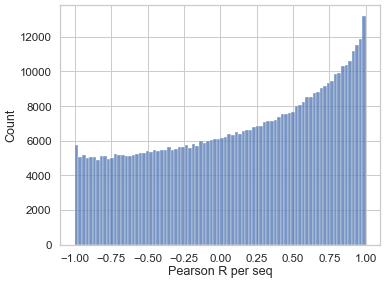

In [23]:
plt.figure(figsize=(8, 6), dpi=50)
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95)
sns.histplot(pearson_r_per_seq)
plt.xlabel(f'Pearson R per seq')
plt.ylabel(f'Count')
# plt.savefig(f'figures/scatter_HepG2-K562_{assay}_exp.png', dpi=400)
plt.savefig(f'figures/hist_pearson_per_seq.png', dpi=400)
plt.show()